<a href="https://colab.research.google.com/github/bengerraty/bengerraty/blob/main/ToyModels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Toy Models 

This notebook includes the toy model training framework used to generate most of the results in the "Toy Models of Superposition" paper. 

The main useful improvement over a basic PyTorch tiny autoencoder is the ability to batch train many models with varying sparsity at once, which is much more efficient than training them one at a time.

This notebook is designed to run in Google Colab's Python 3.7 environment.

Hopefully through messing around we can see how the orthogonality $O(n)$ works


In [ ]:
!pip install einops
!apt-get install -y ffmpeg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:4.2.7-0ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [ ]:
import torch
from torch import nn
from torch.nn import functional as F

import math
from typing import Optional
import matplotlib.animation as animation

from dataclasses import dataclass, replace
import numpy as np
import einops

from tqdm.notebook import trange

import matplotlib.colors as mcolors

import time
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import MDS

import IPython.display as display

from scipy.stats import ortho_group

from matplotlib import colors as mcolors
from mpl_toolkits.mplot3d import Axes3D

from IPython.display import clear_output

# Base Case 


In [ ]:
@dataclass
class Config:
  n_features: int
  n_hidden: int

  # We optimize n_instances models in a single training loop
  # to let us sweep over sparsity or importance curves efficiently.

  # We could potentially use torch.vmap instead.
  n_instances: int
 
class Model(nn.Module):
  def __init__(self, 
               config, 
               feature_probability: Optional[torch.Tensor] = None,
               importance: Optional[torch.Tensor] = None,               
               device='cuda'):
    super().__init__()
    self.config = config
    self.W = nn.Parameter(torch.empty((config.n_instances, config.n_features, config.n_hidden), device=device))
    nn.init.xavier_normal_(self.W)
    self.b_final = nn.Parameter(torch.zeros((config.n_instances, config.n_features), device=device))
    #self.c_final = nn.Parameter(torch.zeros((config.n_instances, config.n_features), device=device))

    if feature_probability is None:
      feature_probability = torch.ones(())
    self.feature_probability = feature_probability.to(device)
    if importance is None:
      importance = torch.ones(())
    self.importance = importance.to(device)

  # This function forward is the ReLU Network 
  def forward(self, features):
    # features: [..., instance, n_features]
    # W: [instance, n_features, n_hidden]
    hidden = torch.einsum("...if,ifh->...ih", features, self.W)
    out = torch.einsum("...ih,ifh->...if", hidden, self.W)
    out = out + self.b_final
    out = F.relu(out) 
    return out

  #this generates the input data
  def generate_batch(self, n_batch):
    feat = torch.rand((n_batch, self.config.n_instances, self.config.n_features), device=self.W.device)
    batch = torch.where(
        torch.rand((n_batch, self.config.n_instances, self.config.n_features), device=self.W.device) <= self.feature_probability,
        feat,
        torch.zeros((), device=self.W.device),
    )
    return batch

In [ ]:
def linear_lr(step, steps):
  return (1 - (step / steps)) # This function returns a linearly decreasing learning rate, decreasing  linearly from its initial value to zero over the course of training.

def constant_lr(*_):
  return 1.0 # This function returns a constant learning rate of 1.0, regardless of the current training step.

def cosine_decay_lr(step, steps):
  return np.cos(0.5 * np.pi * step / (steps - 1))

# This function returns a learning rate that decreases according to a cosine function, such that the learning rate starts close to 1, then decreases to zero over the course of training.
def optimize(model,steps, 
             render=False, #Boolean flag that specifies whether or not to render the output of the model during training. When render is set to True, the output of the model will be displayed on the screen, usually as an image, for each batch of training data. 
             n_batch=1024, #number of training examples per batch, larger value of n_batch can lead to faster convergence of the model but also requires more memory and computation time per iteration.
             #steps= 10_000, #number of trainging steps (iterations)
             print_freq=100, #frequency to print the loss, so here every 100 steps
             lr=1e-3, # learning rate that is used to scale the gradient during optimization, determines the step size taken during gradient descent
             lr_scale=constant_lr, # can scale the learning rate based on the current step and the total number of steps, but doesn't
             hooks=[]):
  cfg = model.config #this contains the data: n features, m dimensions and number of instances

  opt = torch.optim.AdamW(list(model.parameters()), lr=lr) # an instance of the AdamW optimizer, which is initialized with the model parameters and the initial learning rate.

  start = time.time() # record start time 
  with trange(steps) as t: # creates the progress bar we see during training
    for step in t: 
      step_lr = lr * lr_scale(step, steps)
      for group in opt.param_groups:
        group['lr'] = step_lr
      opt.zero_grad(set_to_none=True)
      batch = model.generate_batch(n_batch) # generates batch data to feed into ReLU netowrk
      out = model(batch) # output of the ReLU network
      error = (model.importance*(batch.abs() - out)**2) # Calculate the loss (MSE) 
      loss = einops.reduce(error, 'b i f -> i', 'mean').sum()
      loss.backward()
      opt.step()
    
      if hooks:
        hook_data = dict(model=model,
                         step=step, 
                         opt=opt,
                         error=error,
                         loss=loss,
                         lr=step_lr)
        for h in hooks:
          h(hook_data)
      if step % print_freq == 0 or (step + 1 == steps):
        t.set_postfix(
            loss=loss.item() / cfg.n_instances,
            lr=step_lr,
        )

# Biasless Case

In [ ]:
@dataclass
class Config:
  n_features: int
  n_hidden: int

  # We optimize n_instances models in a single training loop
  # to let us sweep over sparsity or importance curves efficiently.

  # We could potentially use torch.vmap instead.
  n_instances: int
 
class Model(nn.Module):
  def __init__(self, 
               config, 
               feature_probability: Optional[torch.Tensor] = None,
               importance: Optional[torch.Tensor] = None,               
               device='cuda'):
    super().__init__()
    self.config = config
    self.W = nn.Parameter(torch.empty((config.n_instances, config.n_features, config.n_hidden), device=device))
    nn.init.xavier_normal_(self.W)

    if feature_probability is None:
      feature_probability = torch.ones(())
    self.feature_probability = feature_probability.to(device)
    if importance is None:
      importance = torch.ones(())
    self.importance = importance.to(device)

  # This function forward is the ReLU Network 
  def forward(self, features):
    # features: [..., instance, n_features]
    # W: [instance, n_features, n_hidden]
    hidden = torch.einsum("...if,ifh->...ih", features, self.W)
    out = torch.einsum("...ih,ifh->...if", hidden, self.W)
    out = F.relu(out)
    return out

  #this generates the input data
  def generate_batch(self, n_batch):
    feat = torch.rand((n_batch, self.config.n_instances, self.config.n_features), device=self.W.device)
    batch = torch.where(
        torch.rand((n_batch, self.config.n_instances, self.config.n_features), device=self.W.device) <= self.feature_probability,
        feat,
        torch.zeros((), device=self.W.device),
    )
    return batch

In [ ]:
def linear_lr(step, steps):
  return (1 - (step / steps)) # This function returns a linearly decreasing learning rate, decreasing  linearly from its initial value to zero over the course of training.

def constant_lr(*_):
  return 1.0 # This function returns a constant learning rate of 1.0, regardless of the current training step.

def cosine_decay_lr(step, steps):
  return np.cos(0.5 * np.pi * step / (steps - 1))

# This function returns a learning rate that decreases according to a cosine function, such that the learning rate starts close to 1, then decreases to zero over the course of training.
def optimize(model, 
             render=False, #Boolean flag that specifies whether or not to render the output of the model during training. When render is set to True, the output of the model will be displayed on the screen, usually as an image, for each batch of training data. 
             n_batch=1024, #number of training examples per batch, larger value of n_batch can lead to faster convergence of the model but also requires more memory and computation time per iteration.
             steps=10_000, #number of trainging steps (iterations)
             print_freq=100, #frequency to print the loss, so here every 100 steps
             lr=1e-3, # learning rate that is used to scale the gradient during optimization, determines the step size taken during gradient descent
             lr_scale=constant_lr, # can scale the learning rate based on the current step and the total number of steps, but doesn't
             hooks=[]):
  cfg = model.config #this contains the data: n features, m dimensions and number of instances

  opt = torch.optim.AdamW(list(model.parameters()), lr=lr) # an instance of the AdamW optimizer, which is initialized with the model parameters and the initial learning rate.

  start = time.time() # record start time 
  with trange(steps) as t: # creates the progress bar we see during training
    for step in t: 
      step_lr = lr * lr_scale(step, steps)
      for group in opt.param_groups:
        group['lr'] = step_lr
      opt.zero_grad(set_to_none=True)
      batch = model.generate_batch(n_batch) # generates batch data to feed into ReLU netowrk
      out = model(batch) # output of the ReLU network
      error = (model.importance*(batch.abs() - out)**2) # Calculate the loss (MSE) 
      loss = einops.reduce(error, 'b i f -> i', 'mean').sum()
      loss.backward()
      opt.step()
    
      if hooks:
        hook_data = dict(model=model,
                         step=step, 
                         opt=opt,
                         error=error,
                         loss=loss,
                         lr=step_lr)
        for h in hooks:
          h(hook_data)
      if step % print_freq == 0 or (step + 1 == steps):
        t.set_postfix(
            loss=loss.item() / cfg.n_instances,
            lr=step_lr,
        )

# Set GPU


In [ ]:
if torch.cuda.is_available():
  DEVICE = 'cuda' # Model will run on a GPU if possible
else:
  DEVICE = 'cpu' # Model will run on the CPU if no GPU available


# Introduction Figure

Reproducing a version of the figure from the introduction, although with a slightly different version of the code.

In [ ]:
config = Config(
    n_features = 5,
    n_hidden = 2,
    n_instances = 10,
)

model = Model(
    config=config,
    device=DEVICE,
    # Exponential feature importance curve from 1 to 1/100
    importance = (0.9**torch.arange(config.n_features))[None, :],
    #importance = torch.tensor([[1.0, 0.1]], device='cuda:0'),
    # Sweep feature frequency across the instances from 1 (fully dense) to 1/20
    feature_probability = (20 ** -torch.linspace(0, 1, config.n_instances))[:, None] # Sparsity values
)

In [ ]:
steps = 10000
optimize(model,steps)

  0%|          | 0/10000 [00:00<?, ?it/s]

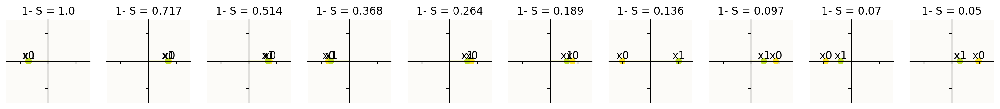

tensor([[1.0000, 0.9000]], device='cuda:0')


In [ ]:
# plots n features into 1 dimension

def plot_intro_diagram(model):
    from matplotlib import colors as mcolors
    from matplotlib import collections as mc
    cfg = model.config
    WA = model.W.detach()  # get the W matrix from the model
    N = len(WA[:, 0])  # number of rows in W (number of features)
    sel = range(config.n_instances)
    plt.rcParams["axes.prop_cycle"] = plt.cycler(
        "color", plt.cm.viridis(model.importance[0].cpu().numpy())
    )
    plt.rcParams['figure.dpi'] = 200
    fig, axs = plt.subplots(1, len(sel), figsize=(2 * len(sel), 2))
    for i, ax in zip(sel, axs):
        W = WA[i].cpu().detach().numpy()
        colors = [mcolors.to_rgba(c)
                  for c in plt.rcParams['axes.prop_cycle'].by_key()['color']]

        # Plot only the first column (1D) as points along the x-axis
        ax.scatter(W[:, 0], np.zeros_like(W[:, 0]), c=colors[0:len(W[:, 0])])
        ax.set_aspect('equal')

        # Add labels to the points
        for idx, (x, c) in enumerate(zip(W[:, 0], colors[:len(W[:, 0])])):
            ax.text(x, 0, f'x{idx}', fontsize=12, ha='center', va='bottom')
            ax.plot([0, x], [0, 0], c=c, linestyle='-')

        # Draw lines connecting points to the origin along the x-axis
        #ax.add_collection(mc.LineCollection(np.stack((np.zeros_like(W[:, 0]), W[:, 0]), axis=1), colors=colors, linewidths=1, linestyle='dashed'))

        z = 1.5
        ax.set_facecolor('#FCFBF8')
        ax.set_title(f"1- S = {round(float(model.feature_probability[i]),3)}")
        ax.set_xlim((-z, z))
        ax.set_ylim((-z, z))
        ax.tick_params(left=True, right=False, labelleft=False,
                       labelbottom=False, bottom=True)
        for spine in ['top', 'right']:
            ax.spines[spine].set_visible(False)
        for spine in ['bottom', 'left']:
            ax.spines[spine].set_position('center')
    plt.show()
    print(model.importance)
plot_intro_diagram(model)

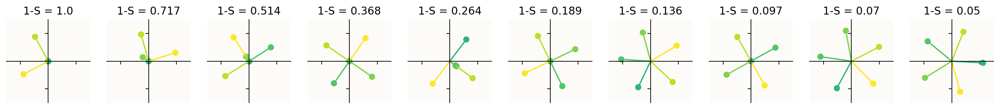

In [ ]:
# Plots n features into 2 dimensions

def plot_intro_diagram(model):
  from matplotlib import colors  as mcolors
  from matplotlib import collections  as mc
  cfg = model.config
  WA = model.W.detach() # get the W matrix from the model 
  #print(torch.Tensor.size(WA[-1]))
  #print(WA)
  N = len(WA[:,0]) # number of rows in W (number of features)
  sel = range(config.n_instances) # can be used to highlight specific sparsity levels (steps in sparsity) number of subplots
  # rcParams is dictionary (google this)
  plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.viridis(model.importance[0].cpu().numpy())) # Gets colour from yellow to green (cm = colourmap, viridis = YtoG), outside loop so same order for each plot to compare, viridis 
  plt.rcParams['figure.dpi'] = 200 # restricts number of pixel per image 
  fig, axs = plt.subplots(1,len(sel), figsize=(2*len(sel),2)) #fig is big figure, axs is subplots globally, then figure size, change to 2 in first to get second layer of plots
  for i, ax in zip(sel, axs): # loop over both simulantously 
      W = WA[i].cpu().detach().numpy() # pull out i-th matrix in tensor of 10 matrices as just a matrix
      colors = [mcolors.to_rgba(c)
            for c in plt.rcParams['axes.prop_cycle'].by_key()['color']] # list comprehension, loop inside vector
      
      ax.scatter(W[:,0], W[:,1], c=colors[0:len(W[:,0])]) # plot first column as x coords and second column and y coords as the dots (no line)
      ax.set_aspect('equal') # aspect ratio of picture same size 
      ax.add_collection(mc.LineCollection(np.stack((np.zeros_like(W),W), axis=1), colors=colors)) # connects points to the origin 
      
      z = 1.5 # This is for setting the dimensions of the graphs
      ax.set_title(f"1-S = {round(float(model.feature_probability[i]),3)}")
      ax.set_facecolor('#FCFBF8') # choose background colour
      ax.set_xlim((-z,z)) # ranges of x values
      ax.set_ylim((-z,z)) # ranges of y values
      ax.tick_params(left = True, right = False , labelleft = False ,
                  labelbottom = False, bottom = True) # notches in the axes, to the left and down from the line
      for spine in ['top', 'right']:
          ax.spines[spine].set_visible(False) # puts black border in top right
      for spine in ['bottom','left']:
          ax.spines[spine].set_position('center')
  plt.show() # prints the plot, can put return in there doesnt break it

plot_intro_diagram(model) # then calls function defined above for the model of the batch

In [ ]:
# plots n features into 3 dimensions

def plot_intro_diagram(model):
    cfg = model.config
    WA = model.W.detach()  # get the W matrix from the model
    N = len(WA[:, 0])  # number of rows in W (number of features)
    sel = range(config.n_instances)
    plt.rcParams["axes.prop_cycle"] = plt.cycler(
        "color", plt.cm.viridis(model.importance[0].cpu().numpy())
    )
    plt.rcParams['figure.dpi'] = 200
    fig = plt.figure(figsize=(2 * len(sel), 2))

    for i, s in enumerate(sel):
        ax = fig.add_subplot(1, len(sel), i+1, projection='3d')
        W = WA[i].cpu().detach().numpy()
        colors = [mcolors.to_rgba(c)
                  for c in plt.rcParams['axes.prop_cycle'].by_key()['color']]

        ax.scatter(W[:, 0], W[:, 1], W[:, 2], c=colors[0:len(W[:, 0])])
        ax.set_aspect('auto')

        # Draw lines connecting points to the origin in 3D
        for w, c in zip(W, colors[:len(W)]):
            ax.plot([0, w[0]], [0, w[1]], [0, w[2]], c=c, linestyle='dashed')

        z = 1.5
        ax.set_facecolor('#FCFBF8')
        ax.set_xlim((-z, z))
        ax.set_ylim((-z, z))
        ax.set_zlim((-z, z))
        ax.tick_params(left=True, right=False, labelleft=False,
                       labelbottom=False, bottom=True)

        # Hide grid lines and ticks
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])

    plt.show()

plot_intro_diagram(model)

Now for the example above, we aim to provide the plots that arise above the dimensionality plot in the Toy Models Paper, using PCA to place the points in the 2D plane. 


# Dimesionailty and Polytopes for $n=2, m=1$


In [ ]:
@torch.no_grad()
def compute_dimensionality(W):
  norms = torch.linalg.norm(W, 2, dim=-1) 
  W_unit = W / torch.clamp(norms[:, :, None], 1e-6, float('inf'))

  interferences = (torch.einsum('eah,ebh->eab', W_unit, W)**2).sum(-1)

  dim_fracs = (norms**2/interferences)
  return dim_fracs.cpu()

In [ ]:
dim_fracs = compute_dimensionality(model.W)

In [ ]:
fig = go.Figure()

density = model.feature_probability[:, 0].cpu()
W = model.W.detach()

for a,b in [(1,2), (2,3), (2,5), (2,6), (2,7)]:
    val = a/b
    fig.add_hline(val, line_color="purple", opacity=0.6, annotation=dict(text=f"{a}/{b}"))

for a,b in [(5,6), (4,5), (3,4), (3,8), (3,12), (3,20)]:
    val = a/b
    fig.add_hline(val, line_color="blue", opacity=0.6, annotation=dict(text=f"{a}/{b}"))

for i in range(len(W)):
    fracs_ = dim_fracs[i]
    N = fracs_.shape[0]
    xs = 1/density
    if i!= len(W)-1:
        dx = xs[i+1]-xs[i]
    fig.add_trace(
        go.Scatter(
            x=1/density[i]*np.ones(N)+dx*np.random.uniform(-0.1,0.1,N),
            y=fracs_,
            marker=dict( # Marker format for scatter plot
                color='black',
                size=2,
                opacity=1,
            ),
            mode='markers',
        )
    )

fig.update_xaxes(
    type='log', 
    title='1/(1-S)',
    showgrid=False,
)
fig.update_yaxes(
    showgrid=False
)
fig.update_layout(width=1600, height=800,showlegend=False) # Set dimensions of the figure

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/s

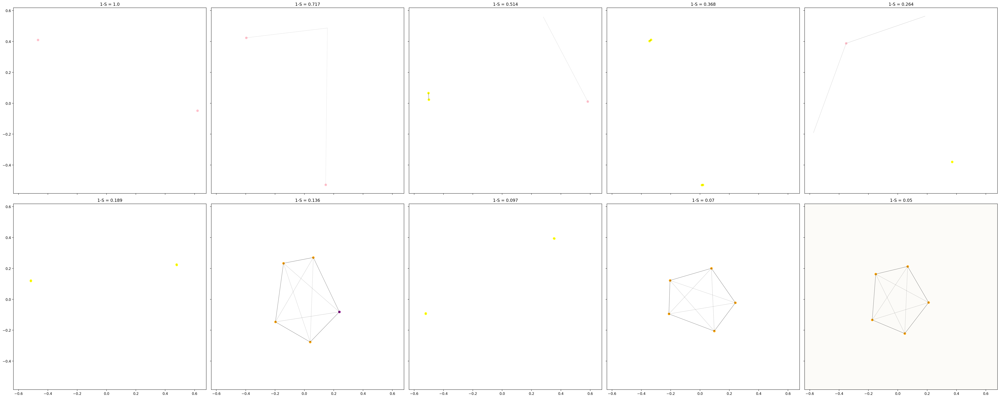

In [ ]:
# This one aims to plot the feature colours based on dimensionality, and have opacity in the dot product line like in the paper

def colour_feature(dim_fracs_per_sparsity):
    if dim_fracs_per_sparsity <= 0.1:
        return 'black' #feature not learned
    elif dim_fracs_per_sparsity  <= 0.35:
        return 'gray'  # super position
    elif dim_fracs_per_sparsity  <= 0.38:
        return 'purple' # D = 3/8 Square Antiprism
    elif dim_fracs_per_sparsity  <= 0.45:
        return 'Orange' # Pentagon  
    elif dim_fracs_per_sparsity  <= 0.55:
        return 'yellow' #digon case D = 1/2
    elif dim_fracs_per_sparsity  <= 0.7:
        return 'green' # Triangle D = 2/3
    elif dim_fracs_per_sparsity  <= 0.8:
        return 'blue' # Tetrahedron D = 3/4
    else:
        return 'pink' # dedicated dimension D = 1


def plot_points(W, force_matrix, epsilon, sparsity, ax, colour):
    for i, vec in enumerate(W.T):
        #print(dim_fracs[:,i])
        #print(dim_fracs[:,i].shape)
        #print(dim_fracs[i,:])
        #print(dim_fracs[i,:].shape)
        if colour[i] != 'black':
          ax.scatter(vec[0], vec[1], c=colour[i])
        #ax.text(vec[0], vec[1])

    for i in range(len(force_matrix)):
        for j in range(i+1, len(force_matrix)):
            if np.abs(force_matrix[i, j]) > epsilon: 
                normalized_dot_product = force_matrix[i, j] / np.max(force_matrix) #normalise dot product to give opacity
                alpha = np.abs(normalized_dot_product) #opacity of the lines
                ax.plot([W[0, i], W[0, j]], [W[1, i], W[1, j]], linestyle='-', linewidth=0.5, color=(0, 0, 0, alpha)) # black lines

    ax.set_title(f"1-S = {sparsity}")

def main():
    n, m = config.n_features, config.n_hidden
    WA = model.W.detach()
    sparsity = density
    sel = range(config.n_instances)

    fig, axes = plt.subplots(2, 5, figsize=(8 * 5, 8 * 2), sharex=True, sharey=True)  # change to 2x5 grid of subplots
    axes = axes.flatten()  # flatten the axes array to make it easier to iterate

    for i, ax in zip(sel, axes):
        W = np.transpose(WA[i].cpu().detach().numpy())

        # Compute dot_product_matrix in high dimensional space
        dot_product_matrix = np.dot(W.T, W)
        force_matrix = dot_product_matrix
        epsilon = 0.1
        sparsity_val = round(float(sparsity[i]), 3)

        # Compute color of points based on dimensionality fraction
        colour = [colour_feature(dim_fracs[i, j].detach().numpy()) for j in range(len(dim_fracs[i, :].detach().numpy()))]

        # Perform MDS to reduce the dimensions to 2
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        W_mds = mds.fit_transform(1 - np.abs(force_matrix)).T

        plot_points(W_mds, force_matrix, epsilon, sparsity_val, ax, colour)

    ax.set_facecolor('#FCFBF8')  # choose background colour
    plt.tight_layout()  # adjust the layout for better spacing between subplots
    plt.show()

if __name__ == "__main__":
    main()

# Dans Requested Plots

In [ ]:
config = Config(
    n_features = 5,
    n_hidden = 2,
    n_instances = 5,
)

model = Model(
    config=config,
    device=DEVICE,
    # Exponential feature importance curve from 1 to 1/100
    #importance = (0.9**torch.arange(config.n_features))[None, :],
    # Sweep feature frequency across the instances from 1 (fully dense) to 1/20
    feature_probability = (20 ** -torch.linspace(0, 3, config.n_instances))[:, None] # Sparsity values
)

  0%|          | 0/2000 [00:00<?, ?it/s]

IndexError: ignored

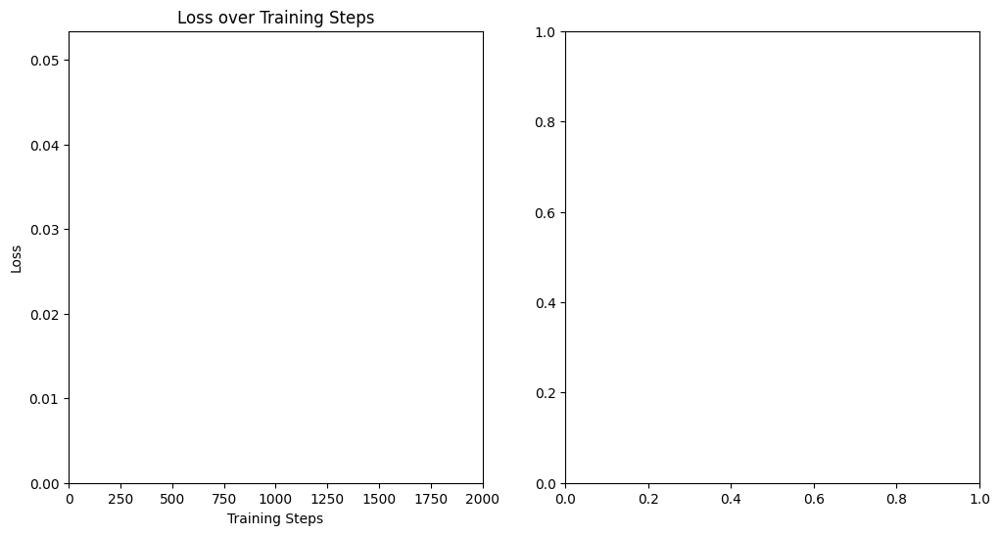

In [ ]:
steps = 2000
optimize(model,steps)

<ipython-input-8-531ea9a7a7f5>:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


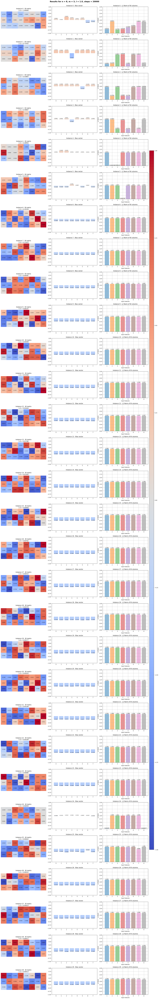

In [ ]:
def plot_weights_biases_and_norms(model, which=np.s_[:]):
    cfg = model.config
    W = model.W.detach().cpu().numpy()
    b = model.b_final.detach().cpu().numpy()
    sparsity = model.feature_probability.cpu().numpy()

    which_instances = np.arange(cfg.n_instances)[which]

    fig, axs = plt.subplots(cfg.n_instances, 3, figsize=(18, cfg.n_instances * 4))
    fig.subplots_adjust(hspace=0.5, wspace=0.3)

    vmin, vmax = -1, 1
    cmap = plt.get_cmap("coolwarm")
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    for idx, inst in enumerate(which_instances):
        # Plot W.T matrix as a heatmap
        im = axs[idx, 0].imshow(
            W[inst].T,
            cmap='coolwarm',
            vmin=-1,
            vmax=1,
        )
        axs[idx, 0].axis('off')  # Remove axis
        
        # Display the entries of W on the heatmap
        for i in range(W[inst].T.shape[0]):
            for j in range(W[inst].T.shape[1]):
                axs[idx, 0].text(j, i, f"{W[inst].T[i, j]:.4f}", ha="center", va="center", color="k", fontsize=8)

        axs[idx, 0].set_title(f"Instance {inst} - W matrix\n1-S = {float(sparsity[inst]):.5f}")

        # Plot bias values as a bar plot with heatmap colors
        bias_colors = sm.to_rgba(b[inst])
        axs[idx, 1].bar(range(cfg.n_features), b[inst], color=bias_colors)
        axs[idx, 1].set_title(f"Instance {inst} - Bias vector")
        axs[idx, 1].set_ylim([-1,1])
        
        # Display the bias values on top of the bars
        for i, v in enumerate(b[inst]):
            axs[idx, 1].text(i, v, f"{v:.4f}", ha="center", va="bottom", fontsize=8)

        # Plot L2 norm of W columns as a bar plot
        for j in range(cfg.n_features):
            col_norms = np.linalg.norm(W[inst,j,:], axis=0)
            axs[idx, 2].bar(j, col_norms, alpha=0.5)
            axs[idx, 2].text(j, col_norms, f'{col_norms:.4g}', ha='center', va='bottom')
        axs[idx, 2].set_title(f"Instance {inst} - L2 Norm of W columns")
        axs[idx, 2].set_xlabel('Input Features')
        axs[idx, 2].set_ylabel('L2 Norm')
        axs[idx, 2].set_xticks(np.arange(cfg.n_features))
        axs[idx, 2].set_xticklabels(np.arange(1, cfg.n_features+1))
        axs[idx, 2].set_ylim([0, 2])
        axs[idx, 2].grid(True)

    # Add colorbar for heatmap
    cbar_ax = fig.add_axes([1, 0.15, 0.03, 0.7])
    fig.colorbar(sm, cax=cbar_ax)
    
    plt.suptitle(f"Results for n = {model.config.n_features}, m = {model.config.n_hidden}, I = {model.importance}, steps = {steps}", fontsize=16, fontweight='bold', y=1)
    plt.tight_layout()
    plt.show()


plot_weights_biases_and_norms(model)

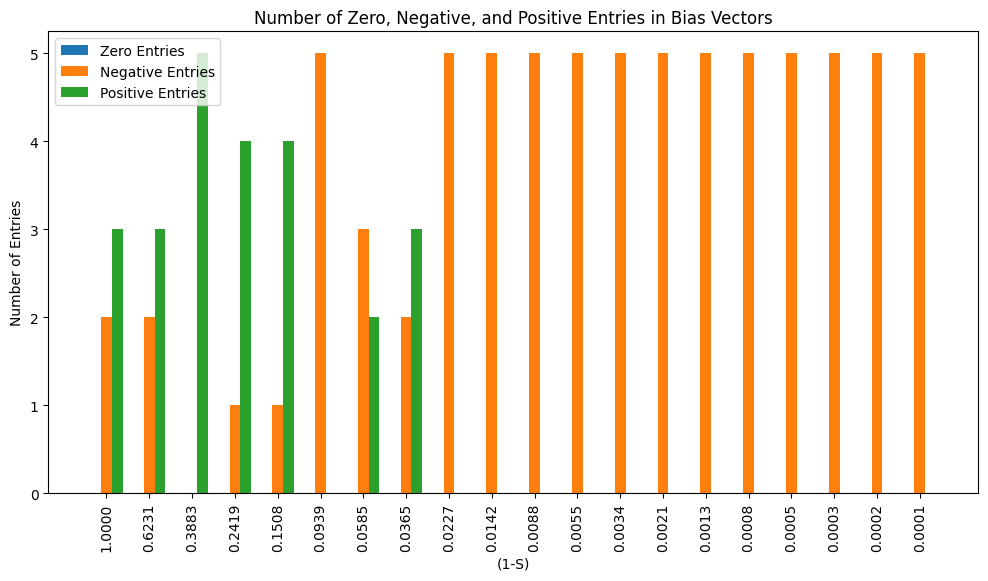

In [ ]:
def check_bias_entries(model):
    b = model.b_final.detach().cpu().numpy()
    n_instances = b.shape[0]
    sparsity = model.feature_probability.cpu().numpy()

    zero_counts = []
    negative_counts = []
    positive_counts = []

    for i in range(n_instances):
        bias_vector = b[i]

        zero_entries = np.isclose(bias_vector, 0, atol=1e-4)
        negative_entries = bias_vector < 0
        positive_entries = bias_vector > 0

        zero_count = np.sum(zero_entries)
        negative_count = np.sum(negative_entries)
        positive_count = np.sum(positive_entries)

        zero_counts.append(zero_count)
        negative_counts.append(negative_count)
        positive_counts.append(positive_count)

    ind = np.arange(0, n_instances * 3, 3)
    width = 0.75

    fig, ax = plt.subplots(figsize=(12, 6))
    ax.bar(ind - width, zero_counts, width, label='Zero Entries')
    ax.bar(ind, negative_counts, width, label='Negative Entries')
    ax.bar(ind + width, positive_counts, width, label='Positive Entries')

    ax.set_xlabel('(1-S)')
    ax.set_ylabel('Number of Entries')
    ax.set_title('Number of Zero, Negative, and Positive Entries in Bias Vectors')
    ax.set_xticks(ind)
    ax.set_xticklabels([f"{s:.4f}" for s in sparsity.flatten()], rotation='vertical')  # Rotate labels vertically
    ax.legend()

    plt.show()

check_bias_entries(model)









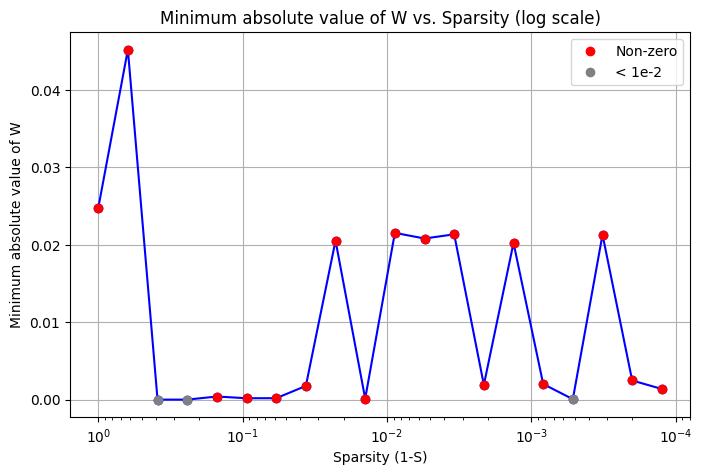

In [ ]:
def plot_min_W_abs_values(model):
    W = model.W.detach().cpu().numpy()
    sparsity = model.feature_probability.cpu().numpy()

    min_abs_values = np.min(np.abs(W), axis=(-1, -2))
    marker_colors = ['grey' if value < 1e-4 else 'red' for value in min_abs_values]
    #print(min_abs_values)
    #print(W)
    plt.figure(figsize=(8, 5))
    plt.semilogx(sparsity, min_abs_values, marker='o', linestyle='-', color='blue')
    for x, y, color in zip(sparsity, min_abs_values, marker_colors):
        plt.plot(x, y, marker='o', color=color)
    plt.xlabel("Sparsity (1-S)")
    plt.ylabel("Minimum absolute value of W")
    plt.title("Minimum absolute value of W vs. Sparsity (log scale)")
    plt.grid()
    plt.gca().invert_xaxis()  # Reverse the x-axis

    # Add legend
    red_marker = plt.Line2D([], [], color='red', marker='o', linestyle='None', label='Non-zero')
    grey_marker = plt.Line2D([], [], color='grey', marker='o', linestyle='None', label='< 1e-4')
    plt.legend(handles=[red_marker, grey_marker])

    plt.show()



plot_min_W_abs_values(model)


# Dimensionality and Polytope Plots




In [ ]:
config = Config(
    n_features = 400,
    n_hidden = 30,
    n_instances = 20, # 20 instances of sparisty 
)

model = Model(
    config=config,
    device=DEVICE,
    # For this experiment, we use constant importance.

    # Sweep feature frequency across the instances from 1 (fully dense) to 1/20
    feature_probability = (20 ** -torch.linspace(0, 1, config.n_instances))[:, None] # exponentially decreasing feature probability 
)

In [ ]:
optimize(model)

  0%|          | 0/10000 [00:00<?, ?it/s]

In [ ]:
@torch.no_grad()
def compute_dimensionality(W):
  norms = torch.linalg.norm(W, 2, dim=-1) 
  W_unit = W / torch.clamp(norms[:, :, None], 1e-6, float('inf'))

  interferences = (torch.einsum('eah,ebh->eab', W_unit, W)**2).sum(-1)

  dim_fracs = (norms**2/interferences)
  return dim_fracs.cpu()

In [ ]:
dim_fracs = compute_dimensionality(model.W)

torch.Size([20, 25, 3])
tensor([[-4.6853e-01, -7.0943e-01, -2.6738e-01],
        [-7.1944e-01, -4.3018e-01,  6.3908e-01],
        [ 3.6160e-01, -6.4821e-01,  7.3701e-01],
        [ 8.0615e-01, -1.7240e-01,  1.3789e-02],
        [ 4.7123e-01,  2.6702e-01, -4.4243e-01],
        [-2.0538e-01,  3.3739e-01,  7.1124e-01],
        [ 3.2627e-01, -4.4137e-01, -3.5599e-01],
        [-2.8957e-04, -2.0498e-02, -4.8546e-06],
        [ 3.5402e-01, -3.0036e-01, -1.8954e-01],
        [ 6.9553e-01,  5.3790e-01,  5.0750e-01],
        [ 2.8572e-01,  3.7078e-01, -4.1097e-01],
        [-1.0907e+00,  3.0002e-01, -1.5992e-01],
        [ 4.2693e-01, -5.7416e-01, -4.5621e-01],
        [-3.1846e-01,  4.5131e-01,  6.9438e-01],
        [-1.5580e-01,  1.0742e+00, -1.7723e-01],
        [ 1.9299e-01, -3.2217e-01,  3.3096e-01],
        [ 4.2638e-01,  2.5929e-01,  2.6572e-01],
        [-1.2656e-01, -1.8751e-01, -3.5452e-02],
        [-2.8015e-01, -6.9201e-01, -1.5098e-01],
        [-1.4873e-02,  2.1254e-02, -5.0830e-0

In [ ]:
fig = go.Figure()

density = model.feature_probability[:, 0].cpu()
W = model.W.detach()

for a,b in [(1,2), (2,3), (2,5), (2,6), (2,7)]:
    val = a/b
    fig.add_hline(val, line_color="purple", opacity=0.6, annotation=dict(text=f"{a}/{b}"))

for a,b in [(5,6), (4,5), (3,4), (3,8), (3,12), (3,20)]:
    val = a/b
    fig.add_hline(val, line_color="blue", opacity=0.6, annotation=dict(text=f"{a}/{b}"))

for i in range(len(W)):
    fracs_ = dim_fracs[i]
    N = fracs_.shape[0]
    xs = 1/density
    if i!= len(W)-1:
        dx = xs[i+1]-xs[i]
    fig.add_trace(
        go.Scatter(
            x=1/density[i]*np.ones(N)+dx*np.random.uniform(-0.1,0.1,N),
            y=fracs_,
            marker=dict( # Marker format for scatter plot
                color='black',
                size=2,
                opacity=1,
            ),
            mode='markers',
        )
    )

fig.update_xaxes(
    type='log', 
    title='1/(1-S)',
    showgrid=False,
)
fig.update_yaxes(
    showgrid=False
)
fig.update_layout(width=1600, height=800,showlegend=False) # Set dimensions of the figure

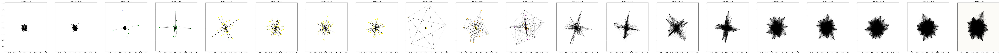

In [ ]:
# This one aims to plot the feature colours based on dimensionality, and have opacity in the dot product line like in the paper

def colour_feature(dim_fracs_per_sparsity):
    if dim_fracs_per_sparsity <= 0.1:
        return 'black' #feature not learned
    elif dim_fracs_per_sparsity  <= 0.35:
        return 'gray'  # super position
    elif dim_fracs_per_sparsity  <= 0.38:
        return 'purple' # D = 3/8 Square Antiprism
    elif dim_fracs_per_sparsity  <= 0.45:
        return 'Orange' # Pentagon  
    elif dim_fracs_per_sparsity  <= 0.55:
        return 'yellow' #digon case D = 1/2
    elif dim_fracs_per_sparsity  <= 0.7:
        return 'green' # Triangle D = 2/3
    elif dim_fracs_per_sparsity  <= 0.8:
        return 'blue' # Tetrahedron D = 3/4
    else:
        return 'pink' # dedicated dimension D = 1


def plot_points(W, force_matrix, epsilon, sparsity, ax, colour):
    for i, vec in enumerate(W.T):
        #print(dim_fracs[:,i])
        #print(dim_fracs[:,i].shape)
        #print(dim_fracs[i,:])
        #print(dim_fracs[i,:].shape)
        ax.scatter(vec[0], vec[1], c=colour[i])
        #ax.text(vec[0], vec[1])

    for i in range(len(force_matrix)):
        for j in range(i+1, len(force_matrix)):
            if np.abs(force_matrix[i, j]) > epsilon: 
                normalized_dot_product = force_matrix[i, j] / np.max(force_matrix) #normalise dot product to give opacity
                alpha = np.abs(normalized_dot_product) #opacity of the lines
                ax.plot([W[0, i], W[0, j]], [W[1, i], W[1, j]], linestyle='-', linewidth=1, color=(0, 0, 0, alpha)) # black lines

    ax.set_title(f"1-S = {sparsity}")

def main():
    n, m = config.n_features, config.n_hidden
    WA = model.W.detach()
    sparsity = density
    sel = range(config.n_instances)
    
    
    fig, axes = plt.subplots(1, len(sel), figsize=(8 * len(sel), 8), sharex=True, sharey=True)

    for i, ax in zip(sel, axes):
        W = np.transpose(WA[i].cpu().detach().numpy())
        
        # Perform PCA to reduce the dimensions to 2
        pca = PCA(n_components=2)
        W_pca = pca.fit_transform(W.T).T

        # compute color of points based on dimensionality fraction
        #print(dim_fracs[1,i].detach().numpy())
        #print(range(len(dim_fracs[:,i].detach().numpy())))

        colour = [colour_feature(dim_fracs[i,j].detach().numpy()) for j in range(len(dim_fracs[i,:].detach().numpy()))]
        #print(colour)

        #dot_product_matrix = np.dot(W_pca.T, W_pca)
        dot_product_matrix = np.dot(W.T,W) # dot products should be in high dimensional space
        force_matrix = dot_product_matrix
        epsilon = 0.1
        sparsity_val = round(float(sparsity[i]), 3)

        plot_points(W_pca, force_matrix, epsilon, sparsity_val, ax, colour)
    ax.set_facecolor('#FCFBF8') # choose background colour
    plt.show()

if __name__ == "__main__":
    main()



/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/s

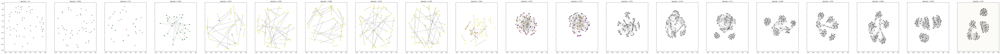

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import MDS

# This one aims to plot the feature colours based on dimensionality, and have opacity in the dot product line like in the paper

def colour_feature(dim_fracs_per_sparsity):
    if dim_fracs_per_sparsity <= 0.1:
        return 'black' #feature not learned
    elif dim_fracs_per_sparsity  <= 0.35:
        return 'gray'  # super position
    elif dim_fracs_per_sparsity  <= 0.38:
        return 'purple' # D = 3/8 Square Antiprism
    elif dim_fracs_per_sparsity  <= 0.45:
        return 'Orange' # Pentagon  
    elif dim_fracs_per_sparsity  <= 0.55:
        return 'yellow' #digon case D = 1/2
    elif dim_fracs_per_sparsity  <= 0.7:
        return 'green' # Triangle D = 2/3
    elif dim_fracs_per_sparsity  <= 0.8:
        return 'blue' # Tetrahedron D = 3/4
    else:
        return 'pink' # dedicated dimension D = 1


def plot_points(W, force_matrix, epsilon, sparsity, ax, colour):
    for i, vec in enumerate(W.T):
        #print(dim_fracs[:,i])
        #print(dim_fracs[:,i].shape)
        #print(dim_fracs[i,:])
        #print(dim_fracs[i,:].shape)
        if colour[i] != 'black':
          ax.scatter(vec[0], vec[1], c=colour[i])
        #ax.text(vec[0], vec[1])

    for i in range(len(force_matrix)):
        for j in range(i+1, len(force_matrix)):
            if np.abs(force_matrix[i, j]) > epsilon: 
                normalized_dot_product = force_matrix[i, j] / np.max(force_matrix) #normalise dot product to give opacity
                alpha = np.abs(normalized_dot_product) #opacity of the lines
                ax.plot([W[0, i], W[0, j]], [W[1, i], W[1, j]], linestyle='-', linewidth=0.5, color=(0, 0, 0, alpha)) # black lines

    ax.set_title(f"Sparsity = {sparsity}")

def main():
    n, m = config.n_features, config.n_hidden
    WA = model.W.detach()
    sparsity = density
    sel = range(config.n_instances)

    fig, axes = plt.subplots(1, len(sel), figsize=(8 * len(sel), 8), sharex=True, sharey=True)

    for i, ax in zip(sel, axes):
        W = np.transpose(WA[i].cpu().detach().numpy())

        # Compute dot_product_matrix in high dimensional space
        dot_product_matrix = np.dot(W.T, W)
        force_matrix = dot_product_matrix
        epsilon = 0.1
        sparsity_val = round(float(sparsity[i]), 3)

        # Compute color of points based on dimensionality fraction
        colour = [colour_feature(dim_fracs[i, j].detach().numpy()) for j in range(len(dim_fracs[i, :].detach().numpy()))]

        # Perform MDS to reduce the dimensions to 2
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        W_mds = mds.fit_transform(1 - np.abs(force_matrix)).T

        plot_points(W_mds, force_matrix, epsilon, sparsity_val, ax, colour)

    ax.set_facecolor('#FCFBF8')  # choose background colour
    plt.show()

if __name__ == "__main__":
    main()

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/usr/local/lib/python3.9/dist-packages/s

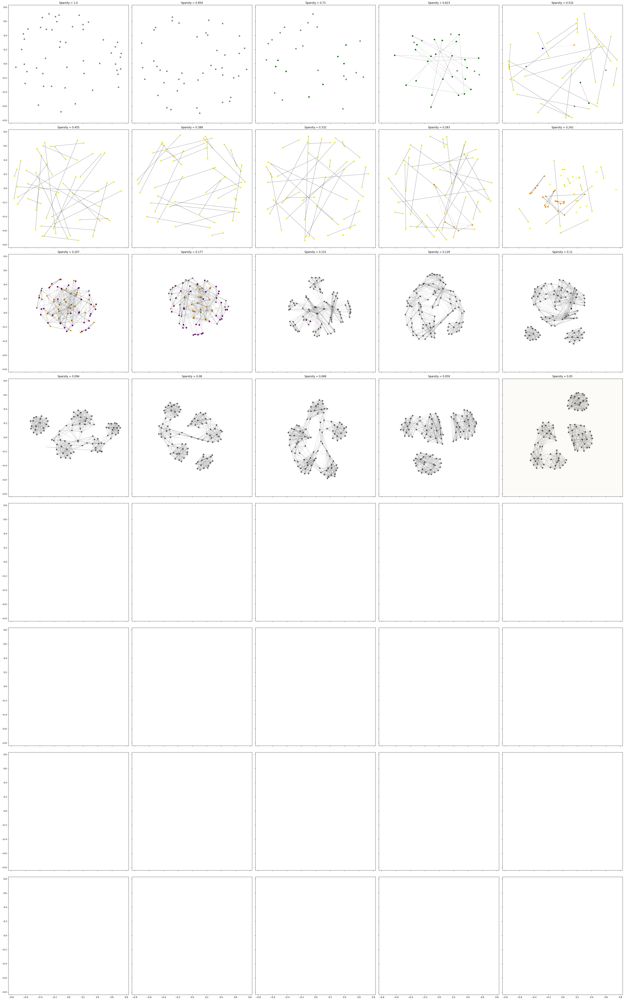

In [ ]:
# This one aims to plot the feature colours based on dimensionality, with opacity and spacing like in paper

def colour_feature(dim_fracs_per_sparsity):
    if dim_fracs_per_sparsity <= 0.1:
        return 'black' #feature not learned
    elif dim_fracs_per_sparsity  <= 0.35:
        return 'gray'  # super position
    elif dim_fracs_per_sparsity  <= 0.38:
        return 'purple' # D = 3/8 Square Antiprism
    elif dim_fracs_per_sparsity  <= 0.45:
        return 'Orange' # Pentagon  
    elif dim_fracs_per_sparsity  <= 0.55:
        return 'yellow' #digon case D = 1/2
    elif dim_fracs_per_sparsity  <= 0.7:
        return 'green' # Triangle D = 2/3
    elif dim_fracs_per_sparsity  <= 0.8:
        return 'blue' # Tetrahedron D = 3/4
    else:
        return 'pink' # dedicated dimension D = 1


def plot_points(W, force_matrix, epsilon, sparsity, ax, colour):
    for i, vec in enumerate(W.T):
        #print(dim_fracs[:,i])
        #print(dim_fracs[:,i].shape)
        #print(dim_fracs[i,:])
        #print(dim_fracs[i,:].shape)
        if colour[i] != 'black':
          ax.scatter(vec[0], vec[1], c=colour[i])
        #ax.text(vec[0], vec[1])

    for i in range(len(force_matrix)):
        for j in range(i+1, len(force_matrix)):
            if np.abs(force_matrix[i, j]) > epsilon: 
                normalized_dot_product = force_matrix[i, j] / np.max(force_matrix) #normalise dot product to give opacity
                alpha = np.abs(normalized_dot_product) #opacity of the lines
                ax.plot([W[0, i], W[0, j]], [W[1, i], W[1, j]], linestyle='-', linewidth=0.5, color=(0, 0, 0, alpha)) # black lines

    ax.set_title(f"1-S = {sparsity}")

def main():
    n, m = config.n_features, config.n_hidden
    WA = model.W.detach()
    sparsity = density
    sel = range(config.n_instances)

    fig, axes = plt.subplots(8, 5, figsize=(8 * 5, 8 * 8), sharex=True, sharey=True)  # change to 8x5 grid of subplots
    axes = axes.flatten()  # flatten the axes array to make it easier to iterate

    for i, ax in zip(sel, axes):
        W = np.transpose(WA[i].cpu().detach().numpy())

        # Compute dot_product_matrix in high dimensional space
        dot_product_matrix = np.dot(W.T, W)
        force_matrix = dot_product_matrix
        epsilon = 0.1
        sparsity_val = round(float(sparsity[i]), 3)

        # Compute color of points based on dimensionality fraction
        colour = [colour_feature(dim_fracs[i, j].detach().numpy()) for j in range(len(dim_fracs[i, :].detach().numpy()))]

        # Perform MDS to reduce the dimensions to 2
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        W_mds = mds.fit_transform(1 - np.abs(force_matrix)).T

        plot_points(W_mds, force_matrix, epsilon, sparsity_val, ax, colour)

    ax.set_facecolor('#FCFBF8')  # choose background colour
    plt.tight_layout()  # adjust the layout for better spacing between subplots
    plt.show()

if __name__ == "__main__":
    main()